In [12]:
#model imports
import pandas as pd
import numpy as np

import tensorflow as tf

from tensorflow.python import keras
from keras import backend as K
K.set_image_dim_ordering('th')

from keras.models import Sequential
from keras.layers.core import Flatten, Dense, Dropout, Activation
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.optimizers import SGD
#import cv2

from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from keras.applications.imagenet_utils import decode_predictions

from keras.utils import to_categorical
from numpy import argmax
from numpy import array

## VGG16 using the correct valid dataset of images
# dataset consists of high quality images = good, average images = bad

In [13]:
import sys
sys.path.append('/home/ubuntu/anaconda3/lib/python3.6/site-packages')

In [3]:
from keras.applications import VGG16

conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(3, 150, 150))

In [3]:
conv_base.summary()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 3, 150, 150)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 150, 150)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 150, 150)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 64, 75, 75)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 75, 75)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 75, 75)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 128, 37, 37)       0         
__________

In [5]:
import os
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

base_dir = '/home/ubuntu/project/faces'

train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validate')
test_dir = os.path.join(base_dir, 'test')


datagen = ImageDataGenerator(rescale=1./255)
batch_size = 20

def extract_features(directory, sample_count):
    features = np.zeros(shape=(sample_count, 512, 4, 4))
    labels = np.zeros(shape=(sample_count))
    generator = datagen.flow_from_directory(
        directory,
        target_size=(150, 150),
        batch_size=batch_size,
        class_mode='binary')
    i = 0
    for inputs_batch, labels_batch in generator:
        features_batch = conv_base.predict(inputs_batch)
        features[i * batch_size : (i + 1) * batch_size] = features_batch
        labels[i * batch_size : (i + 1) * batch_size] = labels_batch
        i += 1
        if i * batch_size >= sample_count:
            # Note that since generators yield data indefinitely in a loop,
            # we must `break` after every image has been seen once.
            break
    return features, labels

train_features, train_labels = extract_features(train_dir, 10000)
validation_features, validation_labels = extract_features(validation_dir, 5000)
test_features, test_labels = extract_features(test_dir, 5000)

Found 10000 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.


In [6]:
train_features = np.reshape(train_features, (10000, 512 * 4 * 4))
validation_features = np.reshape(validation_features, (5000, 512 * 4 * 4))
test_features = np.reshape(test_features, (5000, 512 * 4 * 4))

In [9]:
# from keras import models
# from keras import layers
# from keras import optimizers

# model = models.Sequential()
# model.add(layers.Dense(256, activation='relu', input_dim=512 * 4 * 4))
# model.add(layers.Dropout(0.5))
# model.add(layers.Dense(1, activation='sigmoid'))

# model.compile(optimizer=optimizers.RMSprop(lr=2e-5),
#               loss='binary_crossentropy',
#               metrics=['acc'])

# history = model.fit(train_features, train_labels,
#                     epochs=30,
#                     batch_size=20,
#                     validation_data=(validation_features, validation_labels))

Train on 10439 samples, validate on 4493 samples
Epoch 1/30
10439/10439 [==============================] - 7s 698us/step - loss: 0.7287 - acc: 0.5168 - val_loss: 0.7184 - val_acc: 0.4803
Epoch 2/30
10439/10439 [==============================] - 7s 693us/step - loss: 0.6887 - acc: 0.5543 - val_loss: 0.6884 - val_acc: 0.5391
Epoch 3/30
10439/10439 [==============================] - 7s 667us/step - loss: 0.6751 - acc: 0.5809 - val_loss: 0.7022 - val_acc: 0.5115
Epoch 4/30
10439/10439 [==============================] - 7s 666us/step - loss: 0.6640 - acc: 0.5961 - val_loss: 0.6966 - val_acc: 0.5246
Epoch 5/30
10439/10439 [==============================] - 7s 662us/step - loss: 0.6536 - acc: 0.6106 - val_loss: 0.6957 - val_acc: 0.5424
Epoch 6/30
10439/10439 [==============================] - 7s 667us/step - loss: 0.6446 - acc: 0.6242 - val_loss: 0.6910 - val_acc: 0.5422
Epoch 7/30
10439/10439 [==============================] - 7s 665us/step - loss: 0.6320 - acc: 0.6448 - val_loss: 0.6957 - v

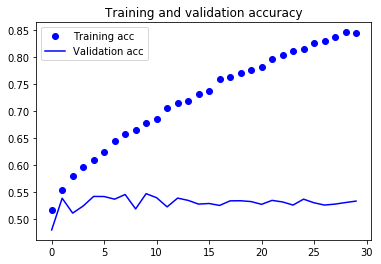

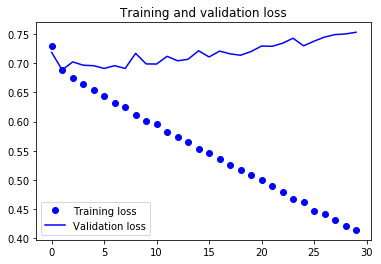

In [10]:
# import matplotlib.pyplot as plt
# %matplotlib inline
# acc = history.history['acc']
# val_acc = history.history['val_acc']
# loss = history.history['loss']
# val_loss = history.history['val_loss']

# epochs = range(len(acc))

# plt.plot(epochs, acc, 'bo', label='Training acc')
# plt.plot(epochs, val_acc, 'b', label='Validation acc')
# plt.title('Training and validation accuracy')
# plt.legend()

# plt.figure()

# plt.plot(epochs, loss, 'bo', label='Training loss')
# plt.plot(epochs, val_loss, 'b', label='Validation loss')
# plt.title('Training and validation loss')
# plt.legend()

# plt.show()

In [13]:
from keras import models
from keras import layers

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

In [14]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 512, 4, 4)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 16,812,353
Trainable params: 16,812,353
Non-trainable params: 0
_________________________________________________________________


In [15]:
print('This is the number of trainable weights '
      'before freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights before freezing the conv base: 30


In [16]:
conv_base.trainable=False

In [17]:
print('This is the number of trainable weights '
      'after freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights after freezing the conv base: 4


In [19]:
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=20,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=2e-5),
              metrics=['acc'])
#val loss
from keras.callbacks import EarlyStopping, ModelCheckpoint
callbacks = [EarlyStopping(monitor='val_loss', patience=2),
             ModelCheckpoint(filepath='best_model.h5', monitor='val_loss', save_best_only=True)]

history = model.fit_generator(
      train_generator,
      steps_per_epoch=50,
      epochs=30,
      validation_data=validation_generator,
      validation_steps=50,
      verbose=2)

Found 10000 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.
Epoch 1/30
 - 135s - loss: 0.6414 - acc: 0.6170 - val_loss: 0.6022 - val_acc: 0.6640
Epoch 2/30
 - 134s - loss: 0.5982 - acc: 0.6750 - val_loss: 0.5339 - val_acc: 0.7310
Epoch 3/30
 - 134s - loss: 0.5699 - acc: 0.7120 - val_loss: 0.5314 - val_acc: 0.7030
Epoch 4/30
 - 134s - loss: 0.5289 - acc: 0.7520 - val_loss: 0.5325 - val_acc: 0.7220
Epoch 5/30
 - 134s - loss: 0.5417 - acc: 0.7480 - val_loss: 0.5090 - val_acc: 0.7380
Epoch 6/30
 - 134s - loss: 0.5129 - acc: 0.7610 - val_loss: 0.5361 - val_acc: 0.7130
Epoch 7/30
 - 134s - loss: 0.5294 - acc: 0.7390 - val_loss: 0.5812 - val_acc: 0.6810
Epoch 8/30
 - 134s - loss: 0.5152 - acc: 0.7600 - val_loss: 0.4658 - val_acc: 0.7820
Epoch 9/30
 - 134s - loss: 0.5155 - acc: 0.7500 - val_loss: 0.4964 - val_acc: 0.7430
Epoch 10/30
 - 134s - loss: 0.4996 - acc: 0.7680 - val_loss: 0.4771 - val_acc: 0.7600
Epoch 11/30
 - 134s - loss: 0.4971 - acc: 0.7640 - val_loss: 0.4

In [20]:
#model.save('kojak1.h5')

In [4]:
from keras.models import load_model
model = load_model('/users/ginachung/desktop/kojak1.h5')

OSError: Unable to open file (unable to open file: name = 'kojak1.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

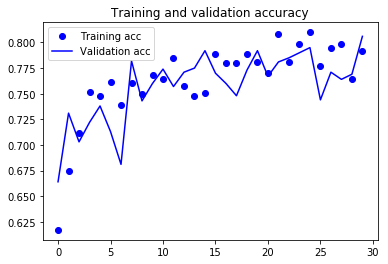

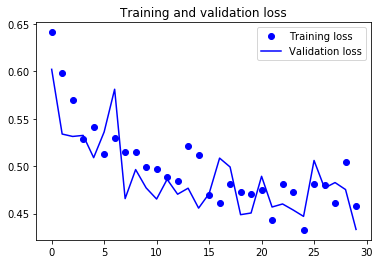

In [23]:
import matplotlib.pyplot as plt
%matplotlib inline
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [85]:
conv_base.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 3, 150, 150)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 150, 150)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 150, 150)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 64, 75, 75)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 75, 75)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 75, 75)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 128, 37, 37)       0         
__________

In [25]:
conv_base.trainable = True
set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [26]:
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),
              metrics=['acc'])

history = model.fit_generator(
      train_generator,
      steps_per_epoch=50,
      epochs=30,
      validation_data=validation_generator,
      validation_steps=50)

Epoch 1/30
50/50 [==============================] - 235s 5s/step - loss: 0.5034 - acc: 0.7690 - val_loss: 0.5375 - val_acc: 0.7290
Epoch 2/30
50/50 [==============================] - 234s 5s/step - loss: 0.4704 - acc: 0.7850 - val_loss: 0.4498 - val_acc: 0.7910
Epoch 3/30
50/50 [==============================] - 234s 5s/step - loss: 0.4597 - acc: 0.7980 - val_loss: 0.4716 - val_acc: 0.7830
Epoch 4/30
50/50 [==============================] - 234s 5s/step - loss: 0.4546 - acc: 0.7930 - val_loss: 0.4419 - val_acc: 0.8140
Epoch 5/30
50/50 [==============================] - 234s 5s/step - loss: 0.4304 - acc: 0.8100 - val_loss: 0.4490 - val_acc: 0.7870
Epoch 6/30
50/50 [==============================] - 234s 5s/step - loss: 0.4363 - acc: 0.8030 - val_loss: 0.4036 - val_acc: 0.8220
Epoch 7/30
50/50 [==============================] - 234s 5s/step - loss: 0.4615 - acc: 0.8060 - val_loss: 0.4990 - val_acc: 0.7800
Epoch 8/30
50/50 [==============================] - 234s 5s/step - loss: 0.4648 - a

In [27]:
#model.save('kojak2.h5')

In [14]:
from keras.models import load_model
model =load_model('kojak2.h5')

In [6]:
conv_base.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 3, 150, 150)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 150, 150)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 150, 150)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 64, 75, 75)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 75, 75)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 75, 75)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 128, 37, 37)       0         
__________

In [7]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 512, 4, 4)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 16,812,353
Trainable params: 16,812,353
Non-trainable params: 0
_________________________________________________________________


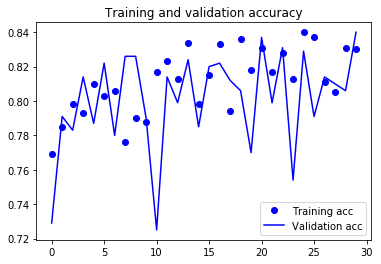

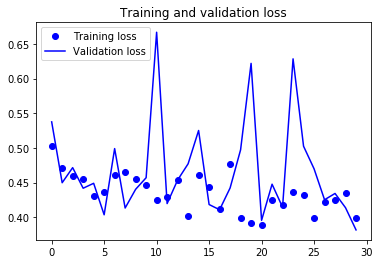

In [28]:
import matplotlib.pyplot as plt
%matplotlib inline
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

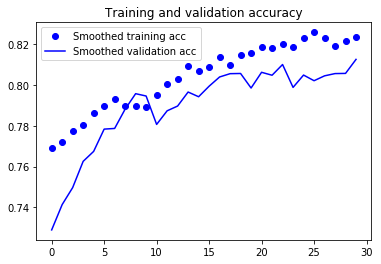

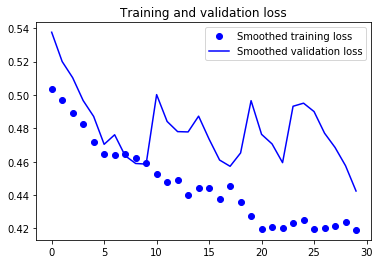

In [29]:
def smooth_curve(points, factor=0.8):
  smoothed_points = []
  for point in points:
    if smoothed_points:
      previous = smoothed_points[-1]
      smoothed_points.append(previous * factor + point * (1 - factor))
    else:
      smoothed_points.append(point)
  return smoothed_points

plt.plot(epochs,
         smooth_curve(acc), 'bo', label='Smoothed training acc')
plt.plot(epochs,
         smooth_curve(val_acc), 'b', label='Smoothed validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs,
         smooth_curve(loss), 'bo', label='Smoothed training loss')
plt.plot(epochs,
         smooth_curve(val_loss), 'b', label='Smoothed validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [30]:
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('test acc:', test_acc)

Found 5000 images belonging to 2 classes.
test acc: 0.8349999988079071


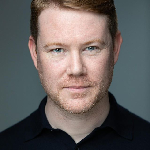

In [22]:
import numpy as np
from keras.preprocessing import image
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.applications.vgg16 import preprocess_input, decode_predictions

def predict(model, img):
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    preds = model.predict(x)
    return preds[0]
img = image.load_img('/users/ginachung/desktop/face/BrXVY5sjOEx.jpg', target_size=(150,150))
preds = predict(load_model('kojak2.h5'), img)

img

In [23]:
preds

array([1.], dtype=float32)

In [15]:
import numpy as np
from keras.preprocessing import image
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.applications.vgg16 import preprocess_input, decode_predictions

def predict(model, img):
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    preds = model.predict(x)
    return preds[0]
img = image.load_img('/home/ubuntu/project/BvCsC7KAhCd.jpg', target_size=(150,150))
preds = predict(load_model('kojak2.h5'), img)

img

FileNotFoundError: [Errno 2] No such file or directory: '/home/ubuntu/project/BvCsC7KAhCd.jpg'

In [18]:
img_path = '/users/ginachung/desktop/face/test11.jpg'

# We preprocess the image into a 4D tensor
from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
#img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)
#img_tensor = img_tensor.transpose(2,1,0)
img_tensor = np.expand_dims(img_tensor, axis=0)
print(img_tensor.shape)

(3, 150, 150)
(1, 3, 150, 150)


In [91]:
preds

array([1.], dtype=float32)

In [13]:
conv_base.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 3, 150, 150)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 150, 150)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 150, 150)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 64, 75, 75)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 75, 75)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 75, 75)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 128, 37, 37)       0         
__________

In [23]:
model.layers[0].layers

In [24]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 512, 4, 4)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 16,812,353
Trainable params: 16,812,353
Non-trainable params: 0
_________________________________________________________________


In [25]:
model.layers[0].get_input_at(0)

<tf.Tensor 'input_1_1:0' shape=(?, 3, 150, 150) dtype=float32>

In [26]:
from keras import models

# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[0].layers[1:8]]

# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.layers[0].get_input_at(0), outputs=layer_outputs)

In [27]:
model.layers[0].get_input_at(0)

<tf.Tensor 'input_1_1:0' shape=(?, 3, 150, 150) dtype=float32>

In [31]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations=activation_model.predict(img_tensor)

In [32]:

first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 64, 150, 150)


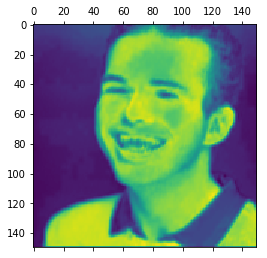

In [33]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, 1, :, :], cmap='viridis')
plt.show()

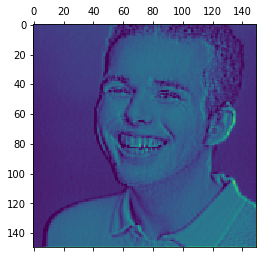

In [17]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, 2, :, :], cmap='viridis')
plt.show()

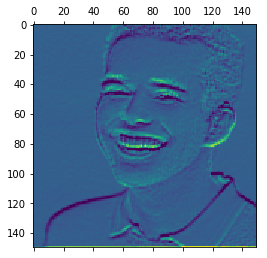

In [18]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, 3, :, :], cmap='viridis')
plt.show()

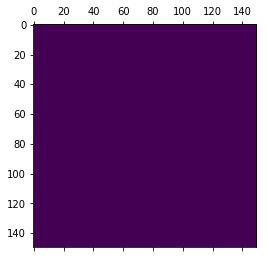

In [26]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, 27, :, :], cmap='viridis')
plt.show()

In [37]:
len(activations)

7

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/ipykernel/__main__.py:29: RuntimeWarning: invalid value encountered in true_divide


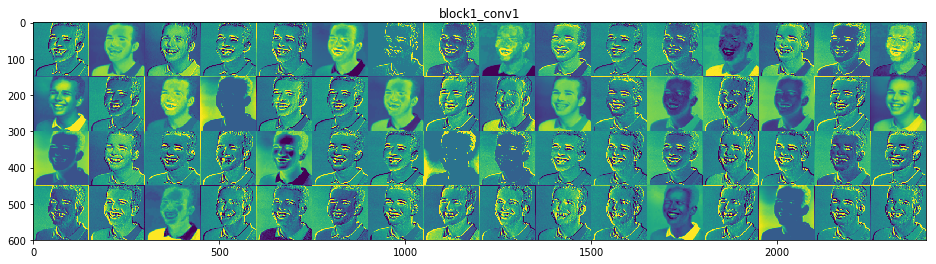

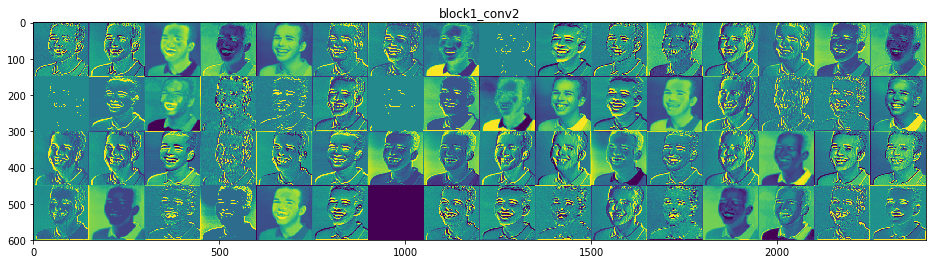

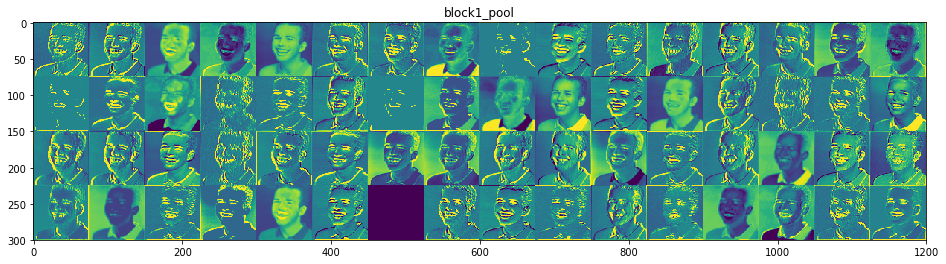

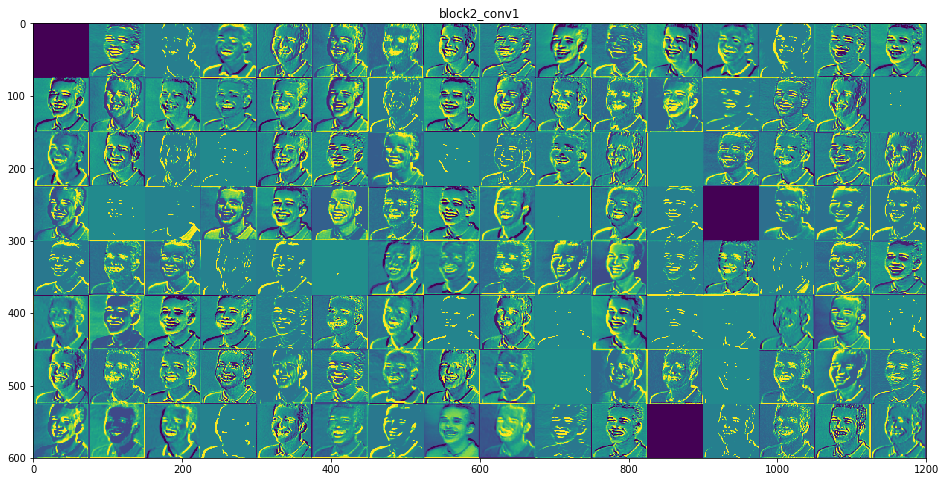

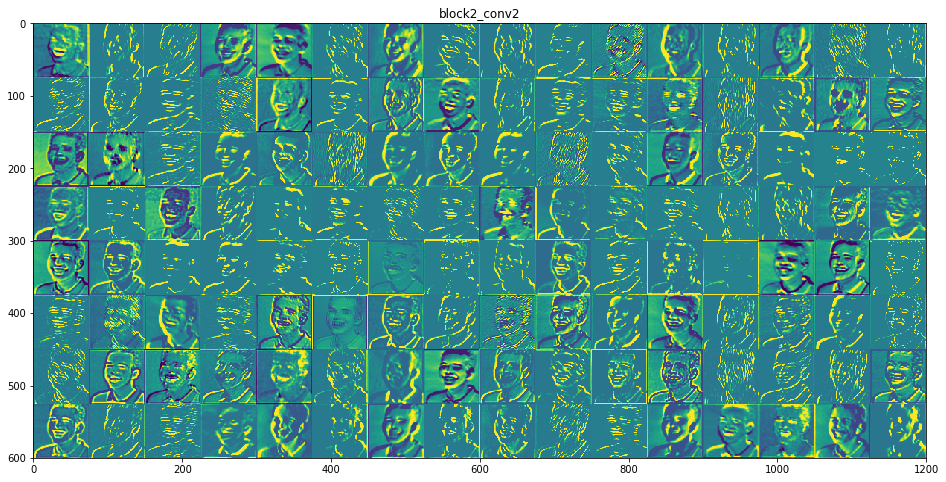

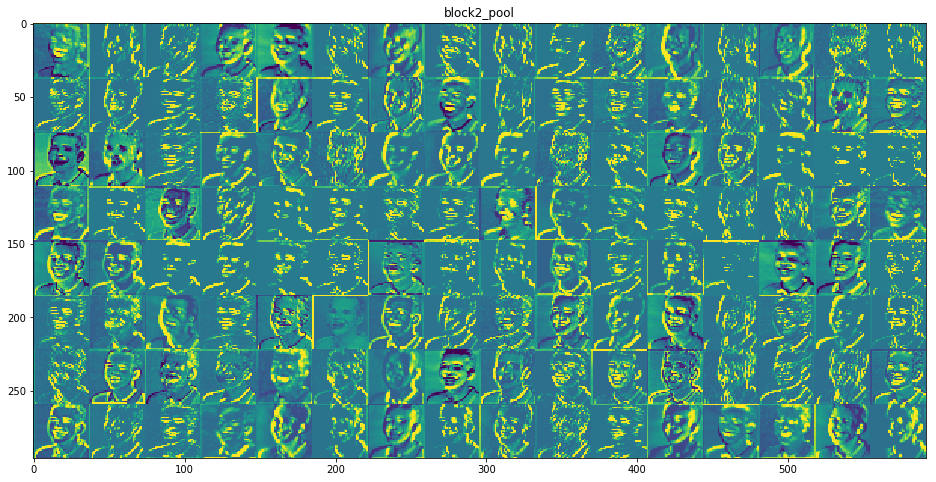

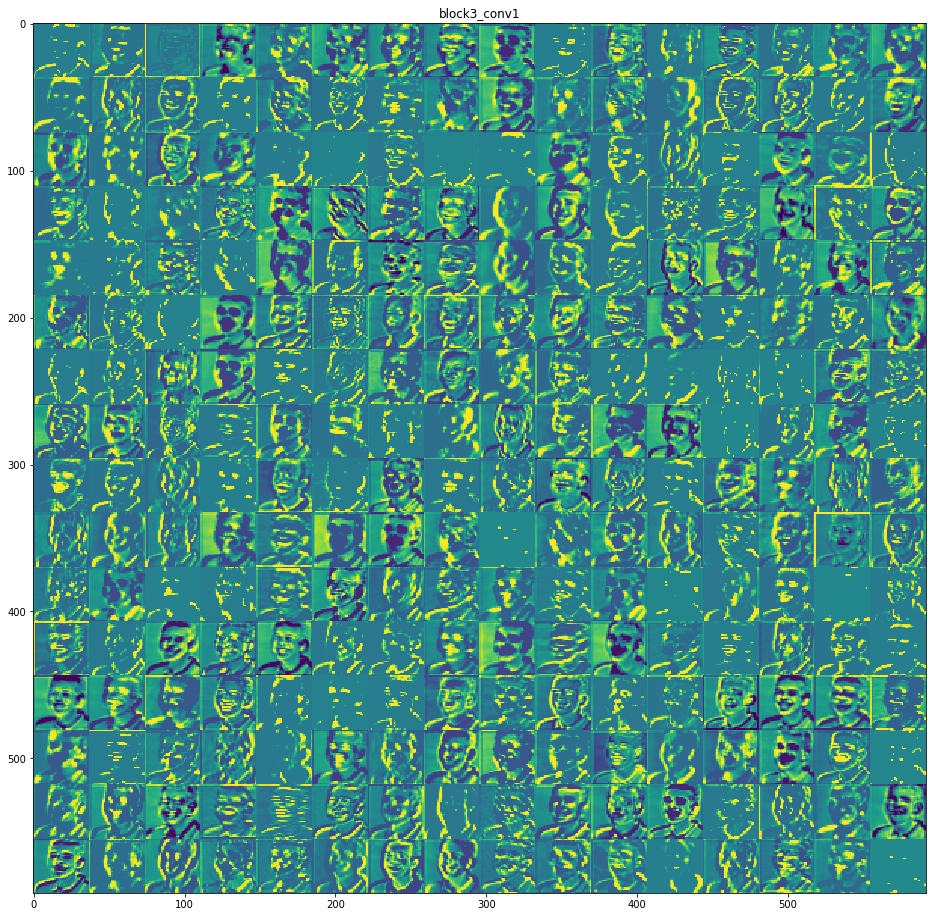

In [100]:
import keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[0].layers[1:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[2]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,col * images_per_row + row, :,:]
            
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

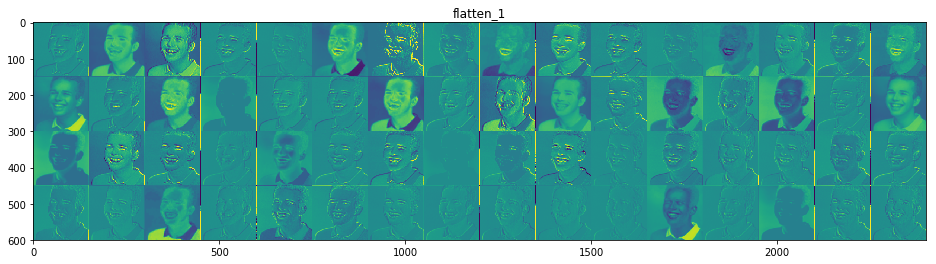

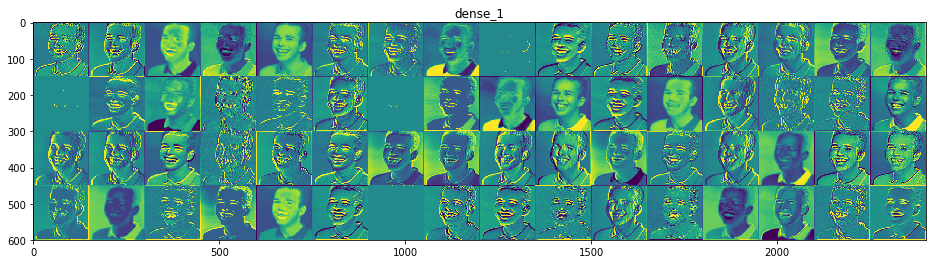

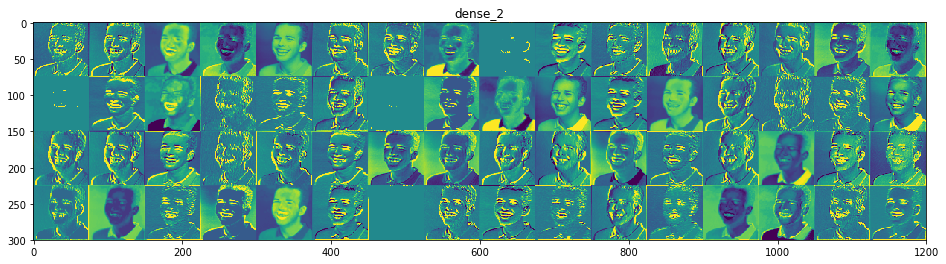

In [47]:
import keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[1:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[2]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,col * images_per_row + row, :,:]
            
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

In [5]:
def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

In [34]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.imshow(generate_pattern('block1_conv1', 0))
plt.show()

ValueError: No such layer: block1_conv1

In [16]:
for layer_name in ['dense_1']:
    size = 64
    margin = 5

    # This a empty (black) image where we will store our results.
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):  # iterate over the rows of our results grid
        for j in range(8):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # Display the results grid
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.show()

ValueError: Index out of range using input dim 2; input has only 2 dims for 'strided_slice_1' (op: 'StridedSlice') with input shapes: [?,256], [4], [4], [4] and with computed input tensors: input[3] = <1 1 1 1>.

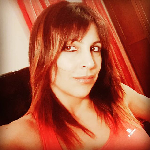

In [35]:
import numpy as np
from keras.preprocessing import image
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.applications.vgg16 import preprocess_input, decode_predictions

def predict(model, img):
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    preds = model.predict(x)
    return preds[0]
img = image.load_img('/home/ubuntu/project/test11.jpg', target_size=(150,150))
preds = predict(load_model('kojak2.h5'), img)

img

In [102]:
preds

array([0.], dtype=float32)

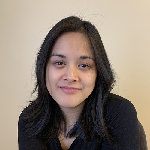

In [23]:
import numpy as np
from keras.preprocessing import image
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.applications.vgg16 import preprocess_input, decode_predictions

def predict(model, img):
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    preds = model.predict(x)
    return preds[0]
img = image.load_img('/home/ubuntu/project/noblur.JPG', target_size=(150,150))
preds = predict(load_model('kojak2.h5'), img)

img

In [24]:
preds

array([4.9364047e-05], dtype=float32)

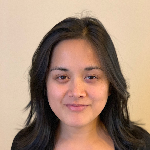

In [5]:
import numpy as np
from keras.preprocessing import image
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.applications.vgg16 import preprocess_input, decode_predictions

def predict(model, img):
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    preds = model.predict(x)
    return preds[0]
img = image.load_img('/home/ubuntu/project/blur3.JPG', target_size=(150,150))
preds = predict(load_model('kojak2.h5'), img)

img

In [18]:
preds

array([1.], dtype=float32)

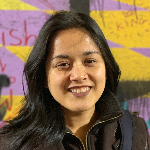

In [6]:
def predict(model, img):
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    preds = model.predict(x)
    return preds[0]
img = image.load_img('/home/ubuntu/project/cathy1blur.JPG', target_size=(150,150))
preds = predict(load_model('kojak2.h5'), img)

img

In [7]:
preds

array([0.], dtype=float32)

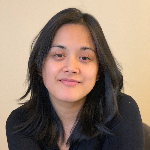

In [19]:
def predict(model, img):
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    preds = model.predict(x)
    return preds[0]
img = image.load_img('/home/ubuntu/project/blur.JPG', target_size=(150,150))
preds = predict(load_model('kojak2.h5'), img)

img

In [20]:
preds

array([1.3425036e-12], dtype=float32)

In [107]:
img_path = '/home/ubuntu/project/test11.jpg'

# We preprocess the image into a 4D tensor
from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
#img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)
#img_tensor = img_tensor.transpose(2,1,0)
img_tensor = np.expand_dims(img_tensor, axis=0)
print(img_tensor.shape)

(3, 150, 150)
(1, 3, 150, 150)


In [108]:
from keras import models

# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[0].layers[1:8]]

# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.layers[0].get_input_at(0), outputs=layer_outputs)

In [109]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations=activation_model.predict(img_tensor)

In [110]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 64, 150, 150)


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/ipykernel/__main__.py:29: RuntimeWarning: invalid value encountered in true_divide


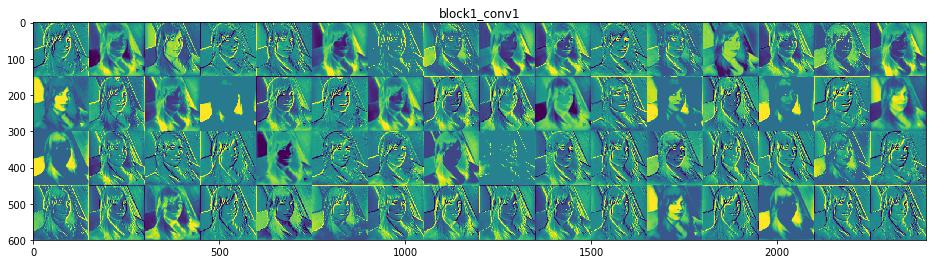

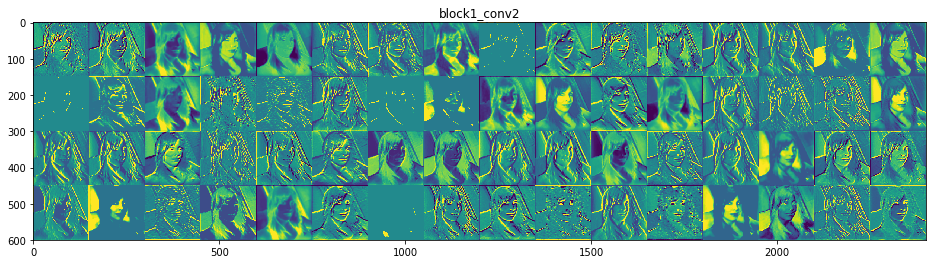

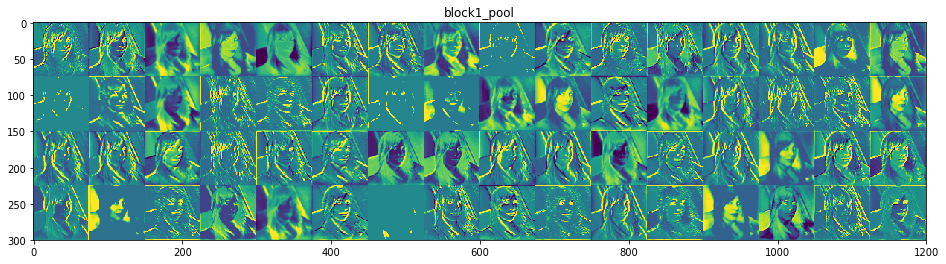

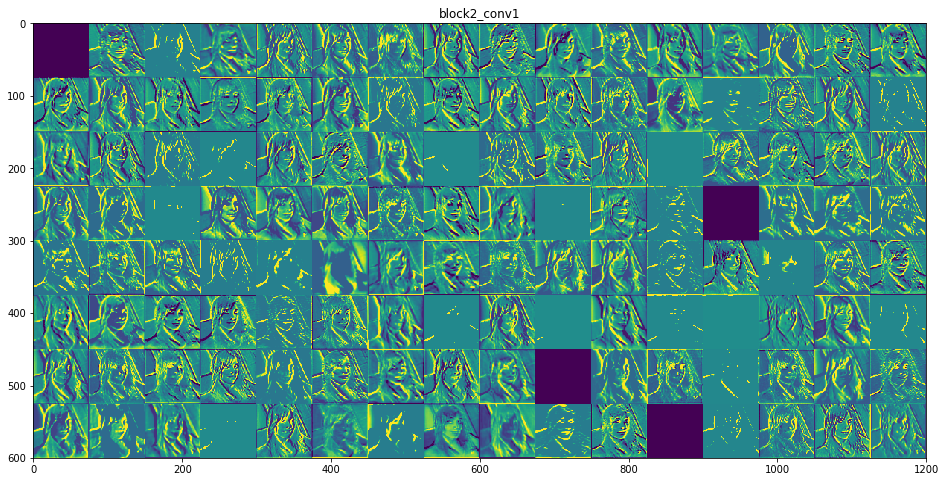

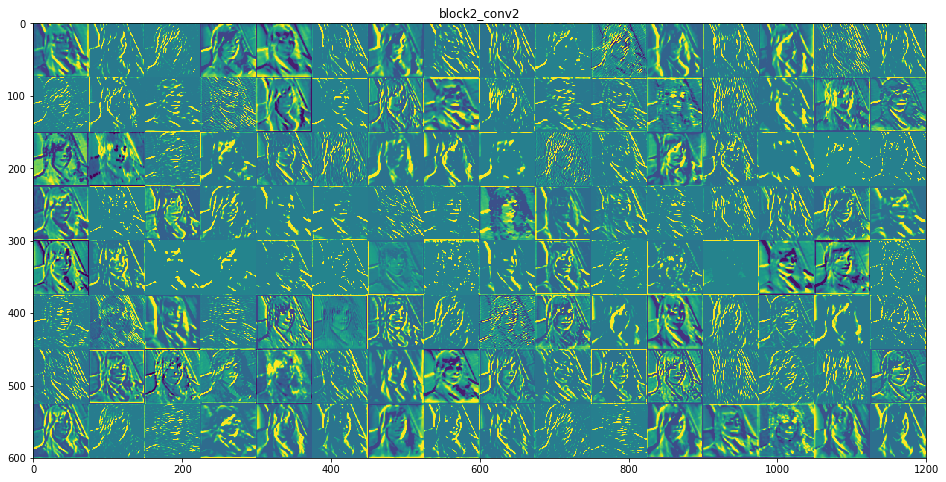

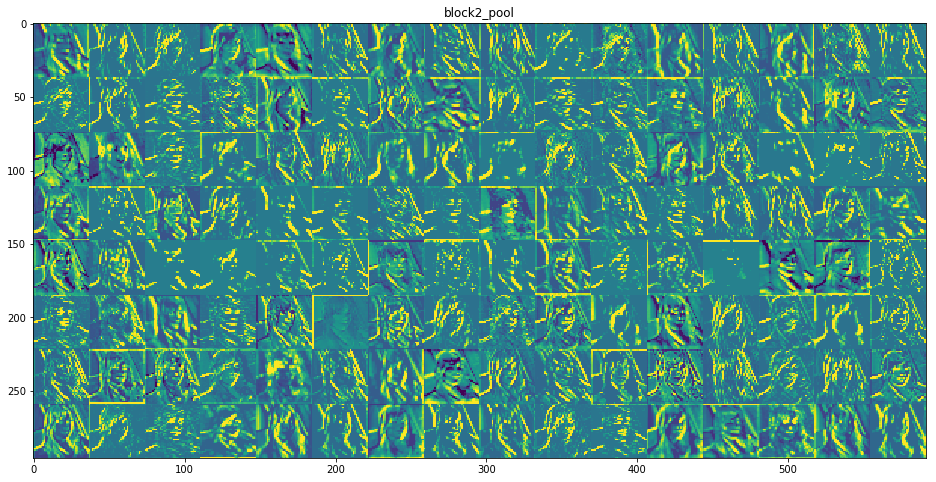

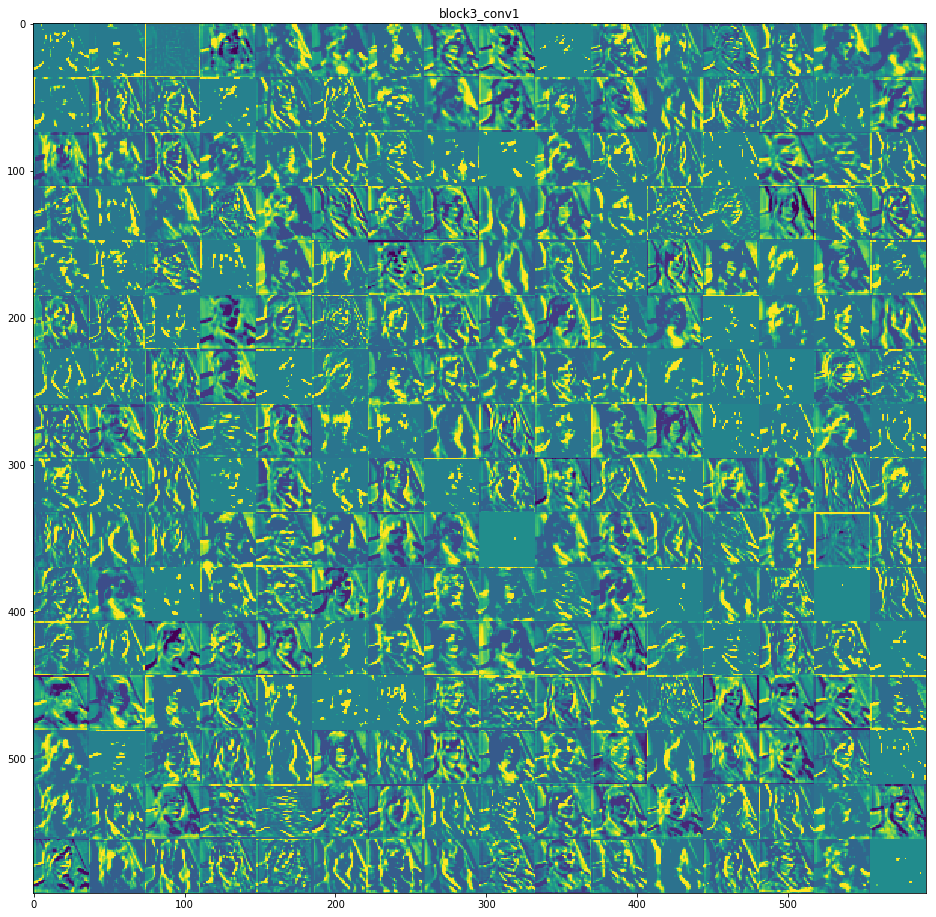

In [111]:
import keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[0].layers[1:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[2]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,col * images_per_row + row, :,:]
            
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

# VGG19, using the old dataset

In [4]:
from keras.applications import VGG19
conv_base = VGG19(include_top=False, input_shape=(3, 150, 150))

In [ ]:
# from keras.applications import VGG16

# conv_base = VGG16(weights='imagenet',
#                   include_top=False,
#                   input_shape=(3, 150, 150))

In [5]:
import os
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

base_dir = '/home/ubuntu/project/selfieimages'

#train_dir = '/home/ubuntu/project/selfieimages/train'
#validation_dir = '/home/ubuntu/project/selfieimages/validation'
#test_dir = '/home/ubuntu/project/selfieimages/test'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')


datagen = ImageDataGenerator(rescale=1./255)
batch_size = 20

def extract_features(directory, sample_count):
    features = np.zeros(shape=(sample_count, 512, 4, 4))
    labels = np.zeros(shape=(sample_count))
    generator = datagen.flow_from_directory(
        directory,
        target_size=(150, 150),
        batch_size=batch_size,
        class_mode='binary')
    i = 0
    for inputs_batch, labels_batch in generator:
        features_batch = conv_base.predict(inputs_batch)
        features[i * batch_size : (i + 1) * batch_size] = features_batch
        labels[i * batch_size : (i + 1) * batch_size] = labels_batch
        i += 1
        if i * batch_size >= sample_count:
            # Note that since generators yield data indefinitely in a loop,
            # we must `break` after every image has been seen once.
            break
    return features, labels

train_features, train_labels = extract_features(train_dir, 999)
validation_features, validation_labels = extract_features(validation_dir, 499)
test_features, test_labels = extract_features(test_dir, 531)

Found 999 images belonging to 2 classes.
Found 499 images belonging to 2 classes.
Found 531 images belonging to 2 classes.


In [6]:
train_features = np.reshape(train_features, (999, 512 * 4 * 4))
validation_features = np.reshape(validation_features, (499, 512 * 4 * 4))
test_features = np.reshape(test_features, (531, 512 * 4 * 4))

In [7]:
from keras import models
from keras import layers
from keras import optimizers

model = models.Sequential()
model.add(layers.Dense(256, activation='relu', input_dim=512 * 4 * 4))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer=optimizers.RMSprop(lr=2e-5),
              loss='binary_crossentropy',
              metrics=['acc'])

history = model.fit(train_features, train_labels,
                    epochs=30,
                    batch_size=20,
                    validation_data=(validation_features, validation_labels))

Train on 999 samples, validate on 499 samples
Epoch 1/30
999/999 [==============================] - 1s 1ms/step - loss: 0.7603 - acc: 0.5075 - val_loss: 0.7210 - val_acc: 0.4469
Epoch 2/30
999/999 [==============================] - 0s 284us/step - loss: 0.7574 - acc: 0.4955 - val_loss: 0.7226 - val_acc: 0.4569
Epoch 3/30
999/999 [==============================] - 0s 282us/step - loss: 0.7115 - acc: 0.5355 - val_loss: 0.7211 - val_acc: 0.4489
Epoch 4/30
999/999 [==============================] - 0s 284us/step - loss: 0.6741 - acc: 0.5726 - val_loss: 0.7280 - val_acc: 0.4870
Epoch 5/30
999/999 [==============================] - 0s 285us/step - loss: 0.6637 - acc: 0.6116 - val_loss: 0.7193 - val_acc: 0.4569
Epoch 6/30
999/999 [==============================] - 0s 283us/step - loss: 0.6525 - acc: 0.5996 - val_loss: 0.7217 - val_acc: 0.4629
Epoch 7/30
999/999 [==============================] - 0s 287us/step - loss: 0.6241 - acc: 0.6617 - val_loss: 0.7221 - val_acc: 0.4729
Epoch 8/30
999/999

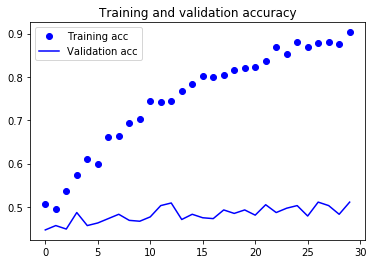

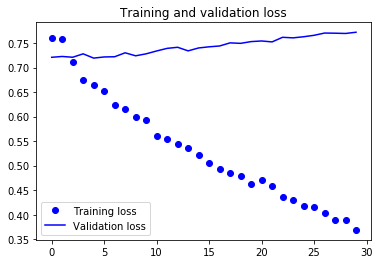

In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [9]:
from keras import models
from keras import layers

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

In [10]:
print('This is the number of trainable weights '
      'before freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights before freezing the conv base: 36


In [11]:
conv_base.trainable=False

In [12]:
print('This is the number of trainable weights '
      'after freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights after freezing the conv base: 4


In [13]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=20,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=2e-5),
              metrics=['acc'])

history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=30,
      validation_data=validation_generator,
      validation_steps=50,
      verbose=2)

Found 999 images belonging to 2 classes.
Found 499 images belonging to 2 classes.
Epoch 1/30
 - 33s - loss: 0.7012 - acc: 0.5240 - val_loss: 0.7082 - val_acc: 0.5050
Epoch 2/30
 - 30s - loss: 0.6884 - acc: 0.5481 - val_loss: 0.7028 - val_acc: 0.5331
Epoch 3/30
 - 30s - loss: 0.6882 - acc: 0.5542 - val_loss: 0.6969 - val_acc: 0.4850
Epoch 4/30
 - 30s - loss: 0.6768 - acc: 0.5844 - val_loss: 0.6998 - val_acc: 0.5471
Epoch 5/30
 - 30s - loss: 0.6625 - acc: 0.5871 - val_loss: 0.7017 - val_acc: 0.5090
Epoch 6/30
 - 30s - loss: 0.6614 - acc: 0.5956 - val_loss: 0.7024 - val_acc: 0.5471
Epoch 7/30
 - 30s - loss: 0.6549 - acc: 0.6098 - val_loss: 0.7046 - val_acc: 0.5271
Epoch 8/30
 - 30s - loss: 0.6511 - acc: 0.6021 - val_loss: 0.7008 - val_acc: 0.5271
Epoch 9/30
 - 30s - loss: 0.6453 - acc: 0.6276 - val_loss: 0.7177 - val_acc: 0.5351
Epoch 10/30
 - 30s - loss: 0.6357 - acc: 0.6298 - val_loss: 0.7179 - val_acc: 0.5491
Epoch 11/30
 - 30s - loss: 0.6366 - acc: 0.6389 - val_loss: 0.7071 - val_acc:

In [32]:
'.' in 'the food'

False

In [33]:
fnames = [os.path.join(train_dir, fname) for fname in os.listdir(train_dir)]
fnames = [name for name in fnames if '.' not in name]

['/home/ubuntu/project/selfieimages/train/good',
 '/home/ubuntu/project/selfieimages/train/bad']

In [40]:
train_dir

'/home/ubuntu/project/selfieimages/train'

In [44]:
temp_train_dir = '/home/ubuntu/project/selfieimages/train/good'
fnames = [os.path.join(temp_train_dir, fname) for fname in os.listdir(temp_train_dir)]
fnames

['/home/ubuntu/project/selfieimages/train/good/Buy6UV0gPeD.jpg',
 '/home/ubuntu/project/selfieimages/train/good/Buz1961lVP4.jpg',
 '/home/ubuntu/project/selfieimages/train/good/BuzVMXelCbd.jpg',
 '/home/ubuntu/project/selfieimages/train/good/BuwdtSsHj5s.jpg',
 '/home/ubuntu/project/selfieimages/train/good/Buz8rtWlIbF.jpg',
 '/home/ubuntu/project/selfieimages/train/good/BuzS6LuFoQA.jpg',
 '/home/ubuntu/project/selfieimages/train/good/Bujxn4Yn56O.jpg',
 '/home/ubuntu/project/selfieimages/train/good/BsErTv2h4hn.jpg',
 '/home/ubuntu/project/selfieimages/train/good/BuzKQD3lZxl.jpg',
 '/home/ubuntu/project/selfieimages/train/good/BpnD732hhoh.jpg',
 '/home/ubuntu/project/selfieimages/train/good/Buz6aqvlZmE.jpg',
 '/home/ubuntu/project/selfieimages/train/good/BuzZZR5Hf4U.jpg',
 '/home/ubuntu/project/selfieimages/train/good/Buy-lpMDPou.jpg',
 '/home/ubuntu/project/selfieimages/train/good/Bo2s2mwFkz-.jpg',
 '/home/ubuntu/project/selfieimages/train/good/Buyl2kyHuxV.jpg',
 '/home/ubuntu/project/se

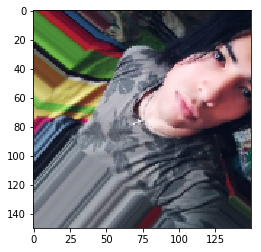

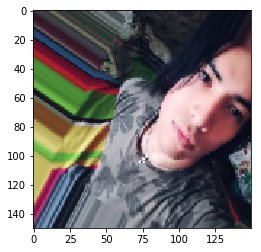

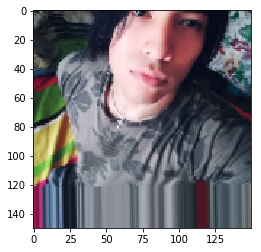

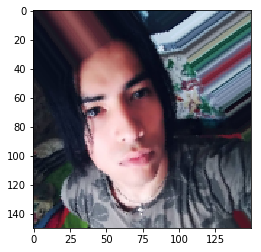

In [55]:
import matplotlib.pyplot as plt
from keras.preprocessing import image
# fnames = [os.path.join(train_dir, fname) for fname in os.listdir(train_dir)]
fnames = [os.path.join(temp_train_dir, fname) for fname in os.listdir(temp_train_dir)]
# fnames = [name for name in fnames if '.' not in name]
img_path =fnames[3]
img=image.load_img(img_path, target_size=(150,150))
x= image.img_to_array(img)
x=x.reshape((1,) + x.shape)
i=0
for batch in train_datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot=plt.imshow(image.array_to_img(batch[0]))
    i+=1
    if i%4==0:
        break
plt.show()

In [20]:
model.save('goodvsbadselfiesvgg19.h5')

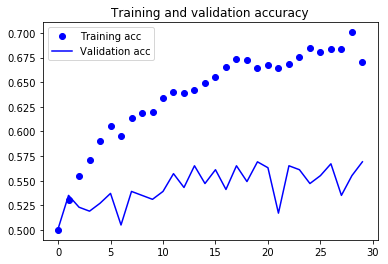

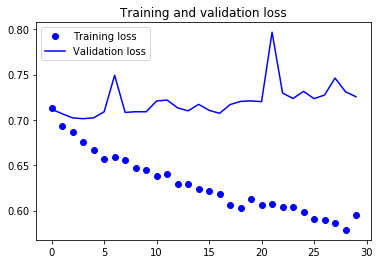

In [21]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [22]:
conv_base.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 3, 150, 150)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 150, 150)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 150, 150)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 64, 75, 75)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 75, 75)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 75, 75)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 128, 37, 37)       0         
__________

In [23]:
conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [24]:
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),
              metrics=['acc'])

MODEL_FILE = 'filename.model'

history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=100,
      validation_data=validation_generator,
      validation_steps=50)

model.save(model.file)

Epoch 1/100
100/100 [==============================] - 35s 347ms/step - loss: 0.5820 - acc: 0.6867 - val_loss: 0.7827 - val_acc: 0.5491
Epoch 2/100
100/100 [==============================] - 32s 315ms/step - loss: 0.5593 - acc: 0.7072 - val_loss: 0.7549 - val_acc: 0.5651
Epoch 3/100
100/100 [==============================] - 32s 318ms/step - loss: 0.5221 - acc: 0.7373 - val_loss: 0.7954 - val_acc: 0.5641
Epoch 4/100
100/100 [==============================] - 32s 316ms/step - loss: 0.5097 - acc: 0.7503 - val_loss: 0.7869 - val_acc: 0.5571
Epoch 5/100
100/100 [==============================] - 31s 313ms/step - loss: 0.4642 - acc: 0.7829 - val_loss: 0.8258 - val_acc: 0.5541
Epoch 6/100
100/100 [==============================] - 32s 318ms/step - loss: 0.4501 - acc: 0.7968 - val_loss: 0.8101 - val_acc: 0.5401
Epoch 7/100
100/100 [==============================] - 32s 318ms/step - loss: 0.4238 - acc: 0.7924 - val_loss: 0.8703 - val_acc: 0.5691
Epoch 8/100
100/100 [===========================

Epoch 61/100
100/100 [==============================] - 32s 316ms/step - loss: 0.0480 - acc: 0.9855 - val_loss: 2.3869 - val_acc: 0.5461
Epoch 62/100
100/100 [==============================] - 32s 318ms/step - loss: 0.0407 - acc: 0.9870 - val_loss: 2.3047 - val_acc: 0.5421
Epoch 63/100
100/100 [==============================] - 32s 317ms/step - loss: 0.0379 - acc: 0.9855 - val_loss: 2.9613 - val_acc: 0.5291
Epoch 64/100
100/100 [==============================] - 32s 322ms/step - loss: 0.0323 - acc: 0.9895 - val_loss: 2.2750 - val_acc: 0.5782
Epoch 65/100
100/100 [==============================] - 32s 316ms/step - loss: 0.0421 - acc: 0.9880 - val_loss: 2.7214 - val_acc: 0.5160
Epoch 66/100
100/100 [==============================] - 32s 317ms/step - loss: 0.0412 - acc: 0.9855 - val_loss: 3.3575 - val_acc: 0.5401
Epoch 67/100
100/100 [==============================] - 32s 319ms/step - loss: 0.0348 - acc: 0.9890 - val_loss: 2.5473 - val_acc: 0.5511
Epoch 68/100
100/100 [===================

In [14]:
model.save('goodvsbadselfies2vgg19.h5')

In [15]:
from keras.models import load_model
model = load_model('goodvsbadselfies2vgg19.h5')

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/keras/engine/saving.py:327: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


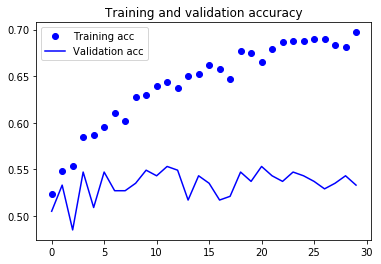

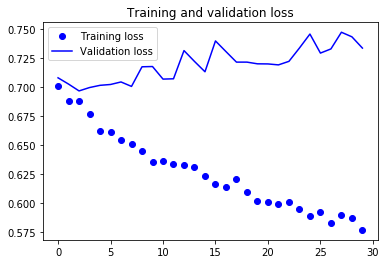

In [16]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

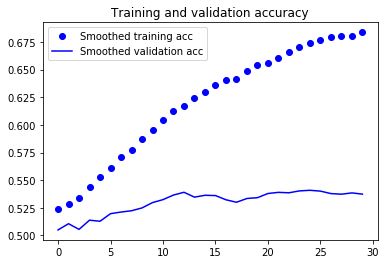

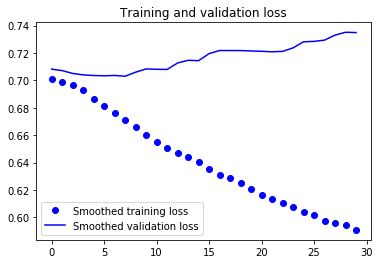

In [17]:

def smooth_curve(points, factor=0.8):
  smoothed_points = []
  for point in points:
    if smoothed_points:
      previous = smoothed_points[-1]
      smoothed_points.append(previous * factor + point * (1 - factor))
    else:
      smoothed_points.append(point)
  return smoothed_points

plt.plot(epochs,
         smooth_curve(acc), 'bo', label='Smoothed training acc')
plt.plot(epochs,
         smooth_curve(val_acc), 'b', label='Smoothed validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs,
         smooth_curve(loss), 'bo', label='Smoothed training loss')
plt.plot(epochs,
         smooth_curve(val_loss), 'b', label='Smoothed validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [18]:

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('test acc:', test_acc)

Found 531 images belonging to 2 classes.
test acc: 0.5166498516751106


In [36]:
import numpy as np
from keras.preprocessing import image
from keras.models import load_model
def predict(model, img):
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    preds = model.predict(x)
    return preds[0]
img = image.load_img('selfietest3.jpg', target_size=(150,150))
preds = predict(load_model('goodvsbadselfies2vgg19.h5'), img)

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/keras/engine/saving.py:327: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


In [37]:
preds

array([0.9999943], dtype=float32)

In [97]:
from keras.preprocessing import image
from keras.applications.vgg19 import preprocess_input, decode_predictions
import numpy as np

# The local path to our target image
img_path = '/home/ubuntu/project/selfietest3.jpg'

# `img` is a PIL image of size 224x224
img = image.load_img(img_path, target_size=(150,150))

# `x` is a float32 Numpy array of shape (224, 224, 3)
x = image.img_to_array(img)

# We add a dimension to transform our array into a "batch"
# of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch
# (this does channel-wise color normalization)
x = preprocess_input(x)

In [94]:
from keras.applications.vgg19 import preprocess_input
from keras.applications.vgg19 import decode_predictions

preds = model.predict(x)
#label = decode_predictions(preds)
#label = label[0]
#preds
#label
print('Predicted:', preds*100,'%')

Predicted: [[99.99943]] %
